# Fast Prompting — Texto → Imagen (OpenAI · DALL·E 3)
### Representaciones institucionales sobre la afiliación de recién nacidos en IOMA

Este cuaderno aplica la técnica de **fast prompting** al flujo **texto → imagen**, con el objetivo de generar
una serie de **imágenes institucionales** que representen a quién se busca afiliar: un recién nacido.

La meta no es que la IA escriba texto dentro de las piezas —algo que no resuelve bien—,
sino obtener **bases visuales** con estilo coherente, profesional y sobrio,
que luego puedan ser integradas en materiales institucionales donde se agregue la información real.

Se trabajan seis versiones de prompt (v1–v6), que recorren un camino de evolución progresiva:

- **v1–v3:** imágenes de carácter más realista, con el recién nacido como protagonista,
mostrado de manera sobria y protegido (manta y variantes de color institucional).  
- **v4–v6:** transición hacia un lenguaje **más gráfico e institucional**, con ilustraciones minimalistas,
uso de la **paleta IOMA**, espacio negativo, símbolos sutiles y composiciones optimizadas.

El resultado final es una **serie de seis imágenes** que muestran cómo la iteración en los prompts
permite pasar de un pedido muy básico a una representación visual más cuidada,
**alineada con la identidad institucional y lista para ser utilizada en materiales de comunicación**.

## Conexión y configuración inicial

En este bloque se realiza la **configuración base** necesaria para trabajar con la generación de imágenes:

1. **Carga de credenciales:** se importa la clave API desde el archivo `.env` para habilitar el acceso a la API de OpenAI de manera segura.  
2. **Selección del modelo de imágenes:** se define como predeterminado `dall-e-3`, aunque podría reemplazarse por `gpt-image-1` según disponibilidad o necesidades.  
3. **Definición de la paleta IOMA:** se establecen los colores institucionales (teal, púrpura, magenta, blanco y gris) que se usarán en los prompts para dar coherencia estética a las imágenes generadas.

Con esta configuración, el entorno queda preparado para ejecutar los diferentes prompts y asegurar que las imágenes producidas mantengan una identidad visual alineada con la institución.


In [ ]:
import os, base64, requests
from io import BytesIO
from PIL import Image
from IPython.display import display, Markdown
from dotenv import load_dotenv
from openai import OpenAI

# 1) Cargar .env y API Key
load_dotenv()
OPENAI_API_KEY = os.getenv("OPENAI_API_KEY", "").strip()
if not OPENAI_API_KEY:
    display(Markdown("> ⚠️ Falta `OPENAI_API_KEY` en tu `.env`."))
else:
    display(Markdown("> ✅ API key detectada (OpenAI)."))

# 2) Cliente e imagen model
IMAGES_MODEL = "dall-e-3"   
client = OpenAI(api_key=OPENAI_API_KEY)

# 3) Paleta IOMA 
PALETA_IOMA = {
    "teal":    "#2D8DA6",
    "purpura": "#6A5AAE",
    "magenta": "#C4286F",
    "blanco":  "#FFFFFF",
    "gris":    "#3C3C3C",
}

print("Modelo:", IMAGES_MODEL)
print("Paleta IOMA:", PALETA_IOMA)

> ✅ API key detectada (OpenAI).

Modelo: dall-e-3
Paleta IOMA: {'teal': '#2D8DA6', 'purpura': '#6A5AAE', 'magenta': '#C4286F', 'blanco': '#FFFFFF', 'gris': '#3C3C3C'}


## Función de generación de imágenes

En este bloque se define la función `ejecutar_prompt_imagen`, que centraliza el proceso de creación de imágenes con la API de OpenAI.  

La función recibe como parámetros:
- **prompt_text**: el texto del prompt que describe la imagen a generar.  
- **nombre_png**: el nombre del archivo donde se guardará la imagen en formato `.png`.  
- **size**: el tamaño de la imagen (por defecto `1024x1024`).  
- **model**: el modelo de imágenes a utilizar (por defecto `dall-e-3`).  

Flujo de la función:
1. Envía el prompt al modelo seleccionado.  
2. Revisa la respuesta: intenta primero obtener una **URL** de la imagen y, si no existe, recurre a la codificación **base64 (b64_json)**.  
3. Descarga o decodifica la imagen y la guarda como archivo local `.png`.  
4. Muestra la imagen en el notebook y confirma la ruta del archivo guardado.  

De esta forma, se facilita la ejecución de cada prompt en las distintas versiones (v1 a v6), manteniendo un procedimiento uniforme y asegurando que cada resultado quede almacenado para su posterior análisis o reutilización.


In [ ]:
def ejecutar_prompt_imagen(prompt_text: str,
                           nombre_png: str,
                           size: str = "1024x1024",
                           model: str = IMAGES_MODEL):
    """
    Genera 1 imagen con OpenAI Images, guarda PNG local y la muestra.
    Maneja salida por URL (lo de clase) o por b64_json.
    """
    resp = client.images.generate(
        model=model,
        prompt=prompt_text,
        n=1,
        size=size
    )

    # Intentar URL directa
    image_url = None
    try:
        image_url = resp.data[0].url
    except Exception:
        pass


    b64_json = None
    try:
        b64_json = resp.data[0].b64_json
    except Exception:
        pass

    ruta = f"{nombre_png}.png"
    if image_url:
        img_data = requests.get(image_url, timeout=120).content
        with open(ruta, "wb") as f:
            f.write(img_data)
    elif b64_json:
        img_bytes = base64.b64decode(b64_json)
        Image.open(BytesIO(img_bytes)).save(ruta)
    else:
        display(Markdown("> ❌ No se pudo obtener la imagen (ni url ni b64_json)."))
        return None

    display(Image.open(ruta))
    print(f"Archivo guardado: {ruta}")
    return ruta


### v1 — Prompt básico (Minimum Viable Prompt)

En este primer paso aplicamos la técnica de **Minimum Viable Prompt**: dar una instrucción mínima, simple y directa.  
No se agregan indicaciones de estilo, composición ni color; solo se establece el sujeto central (el recién nacido).  
La idea es tener una **línea base** que muestre cómo responde el modelo sin restricciones adicionales,  
lo que permitirá comparar y entender claramente la mejora en cada iteración posterior.



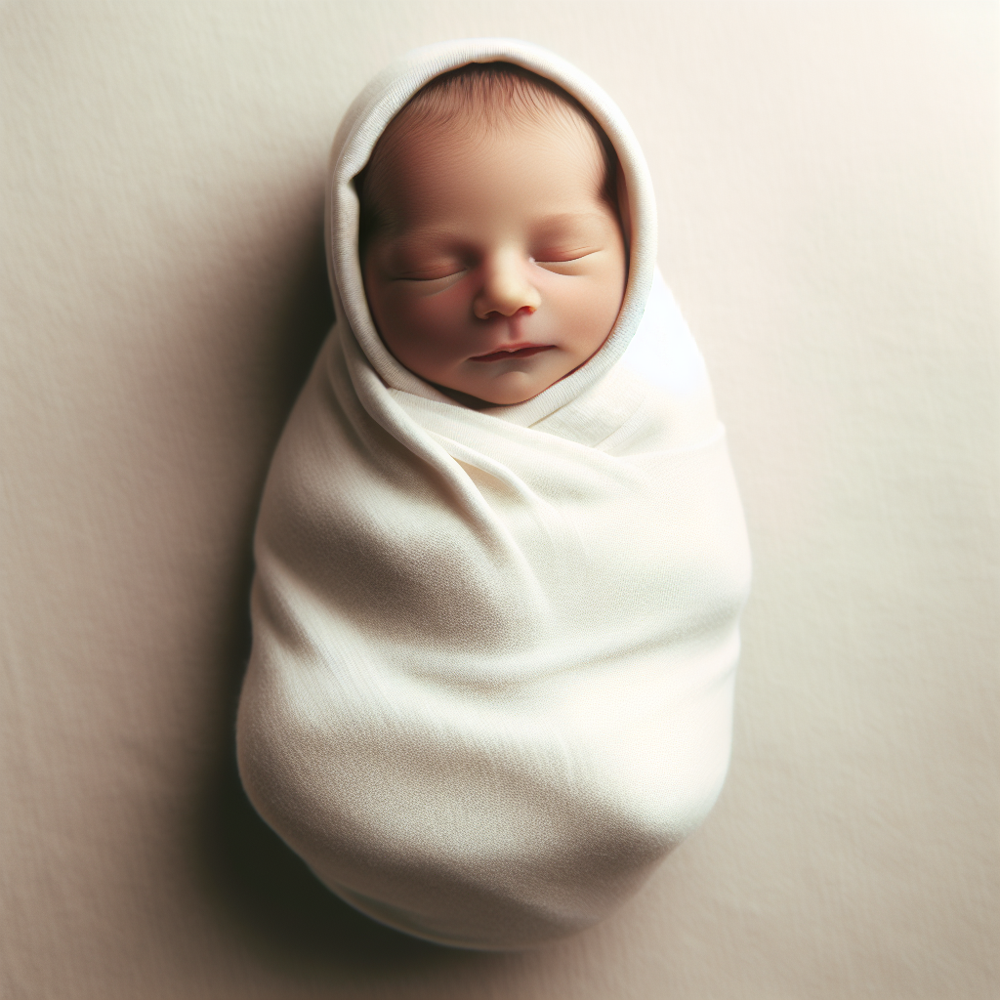

Archivo guardado: v1.png


'v1.png'

In [5]:
prompt_v1 = """
Generar una imagen realista de un recién nacido envuelto en una manta blanca lisa y simple,
en un entorno neutro, sin ningún tipo de texto en la imagen.
"""
ejecutar_prompt_imagen(prompt_v1, "v1")


### v2 — Tono institucional

Aquí aplicamos la técnica de **contextualización del tono y la audiencia**.  
Ya no alcanza con pedir “una imagen de un recién nacido”: especificamos que sea **institucional, sobria y formal**,  
de modo que se acerque al tipo de comunicación visual que usaría un organismo oficial.  
Este paso busca que la IA no genere un resultado genérico, sino que incorpore **cualidades propias de lo institucional**  
(como limpieza, neutralidad y seriedad), acercando la pieza al contexto de uso real.


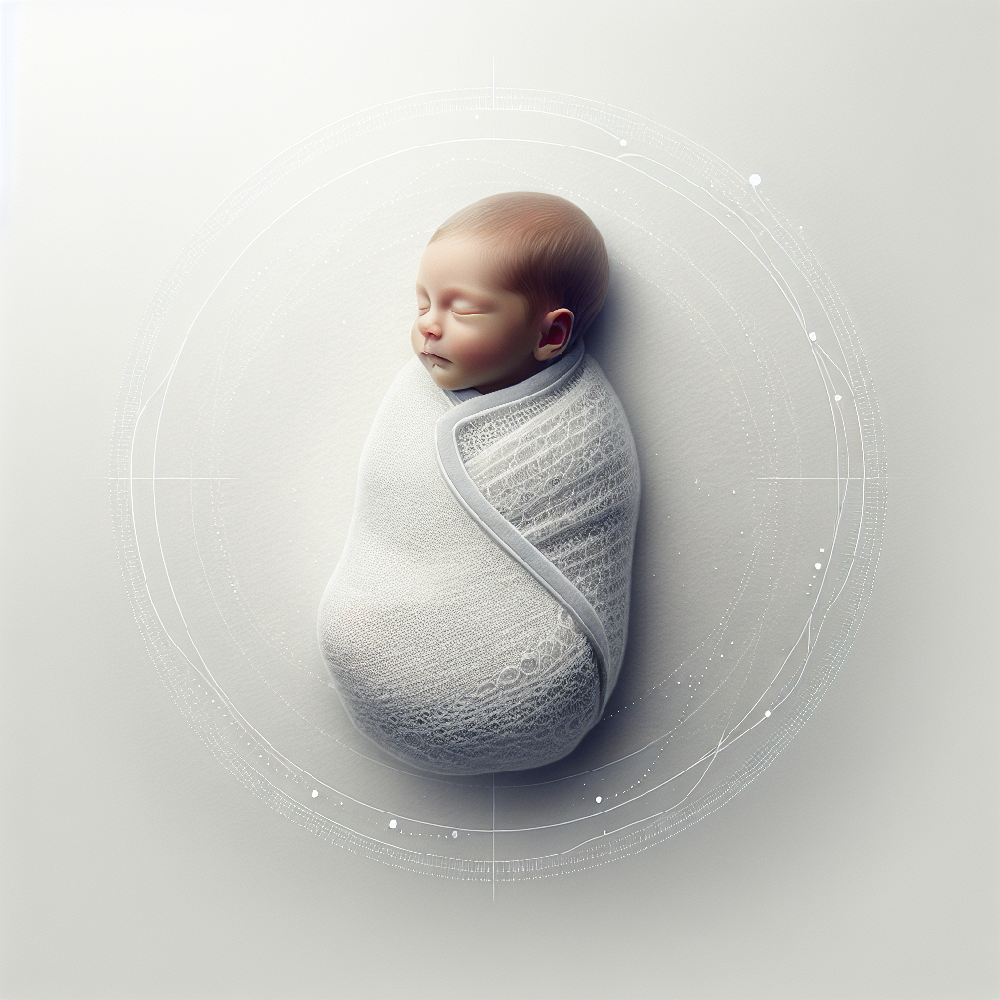

Archivo guardado: v2.png


'v2.png'

In [6]:
prompt_v2 = """
Generar una imagen realista e institucional de un recién nacido envuelto en una manta blanca,
con un borde gris claro o un patrón muy sutil en la tela.
Fondo limpio y luminoso, sin ningún tipo de texto en la imagen.
"""
ejecutar_prompt_imagen(prompt_v2, "v2")


### v3 — Paleta institucional aplicada

La tercera iteración incorpora la técnica de **restricciones visuales**, añadiendo la **paleta de colores de IOMA**.  
El objetivo es alinear la imagen con la **identidad visual institucional**,  
de modo que el resultado no solo sea claro y sobrio, sino que también evoque de inmediato la pertenencia a la organización.  
Al pedir explícitamente los colores teal, púrpura y magenta, se busca un **mayor control estético**,  
que prepara el terreno para un diseño más consistente con la marca institucional.


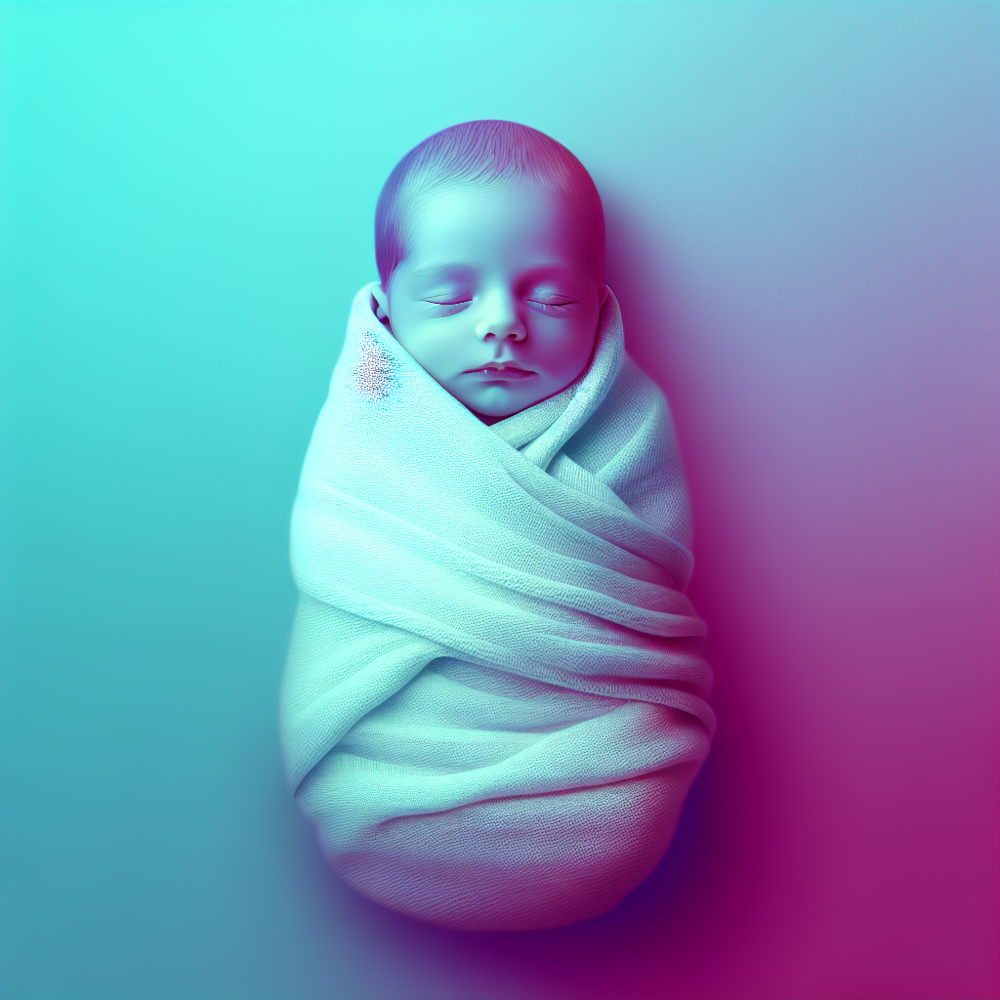

Archivo guardado: v3.png


'v3.png'

In [7]:
prompt_v3 = f"""
Generar una imagen realista de un recién nacido envuelto en una manta blanca
con un ligero degradado en tonos teal {PALETA_IOMA['teal']} y púrpura {PALETA_IOMA['purpura']}.
Fondo con un degradado suave de la paleta IOMA (teal {PALETA_IOMA['teal']}, púrpura {PALETA_IOMA['purpura']}, magenta {PALETA_IOMA['magenta']}).
Sin ningún tipo de texto en la imagen.
"""
ejecutar_prompt_imagen(prompt_v3, "v3")


### v4 — Iconografía y accesibilidad

En este paso se aplica la técnica de **enriquecimiento visual mediante iconografía**.  
Se añaden símbolos discretos (documento, identidad, salud) en el fondo, que funcionan como un refuerzo semántico,  
comunicando la idea de afiliación y gestión administrativa sin necesidad de texto.  
A la vez, se incorporan criterios de **accesibilidad visual**: contraste, limpieza y equilibrio,  
para garantizar que la imagen sea clara y legible, respetando la usabilidad en un entorno institucional.


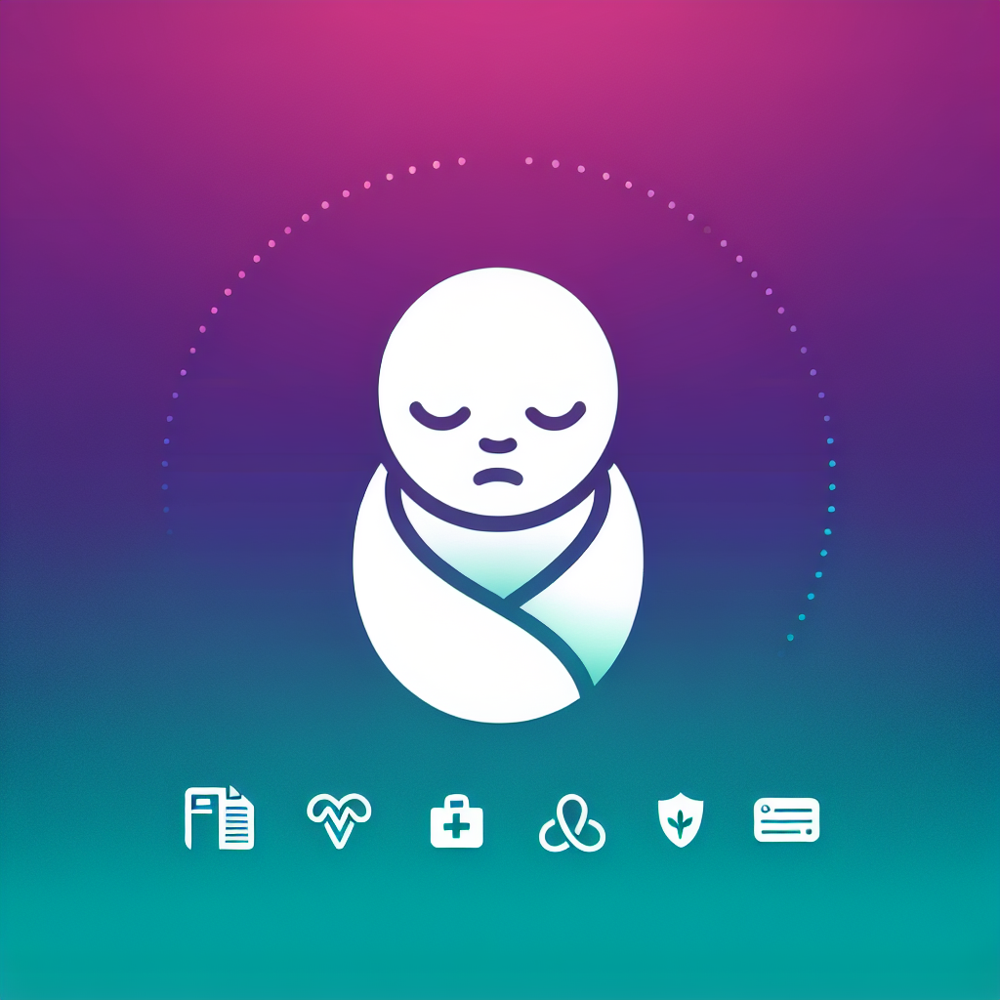

Archivo guardado: v4.png


'v4.png'

In [3]:
prompt_v4 = f"""
Generar una ilustración institucional de un recién nacido representado de forma simple,
sobre un fondo degradado de la paleta IOMA (teal {PALETA_IOMA['teal']}, púrpura {PALETA_IOMA['purpura']}, magenta {PALETA_IOMA['magenta']}).
Agregar iconografía sutil y discreta en segundo plano (símbolos de documento, identidad o salud).
Sin ningún tipo de texto en la imagen.
"""
ejecutar_prompt_imagen(prompt_v4, "v4")


### v5 — Composición con espacio negativo

En esta etapa se trabaja con la técnica de **diseño compositivo**: se especifica un círculo blanco central y un fondo institucional,  
creando **espacio negativo** alrededor. Esto tiene un fin práctico: dejar lugar para que posteriormente pueda añadirse texto real  
(por ejemplo, en una pieza gráfica final diseñada por humanos).  
Aquí el prompt no busca un resultado “completo” en sí mismo, sino una **base visual utilizable**,  
mostrando cómo el fast prompting puede orientar la IA a producir imágenes que encajen en un flujo de diseño profesional.


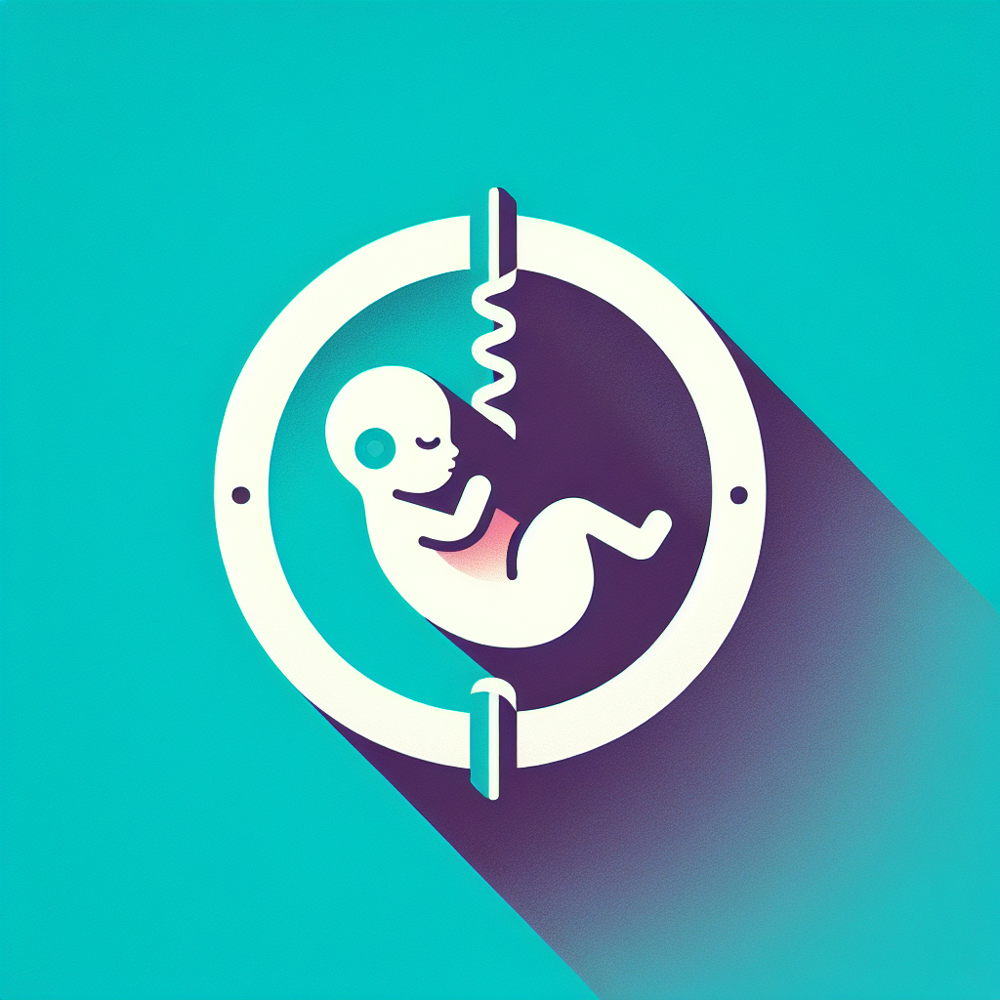

Archivo guardado: v5.png


'v5.png'

In [11]:
prompt_v5 = f"""
Generar una ilustración institucional de un recién nacido como figura central,
ubicado dentro de un círculo blanco con espacio negativo alrededor.
Fondo con un degradado institucional (teal {PALETA_IOMA['teal']}, púrpura {PALETA_IOMA['purpura']}, magenta {PALETA_IOMA['magenta']}).
Composición equilibrada, sin ningún tipo de texto en la imagen.
"""
ejecutar_prompt_imagen(prompt_v5, "v5")


### v6 — Consolidación optimizada

La última versión integra todas las técnicas anteriores en un resultado más cuidado y representativo.  
Se emplea la técnica de **integración y refinamiento**, sumando un halo luminoso o un marco circular sutil en el fondo,  
para reforzar el foco en el recién nacido y dar cierre a la progresión visual.  
El estilo pasa a ser más **gráfico e institucional**, dejando atrás el realismo inicial,  
para llegar a una composición elegante, clara y coherente con la identidad de IOMA.  
Este cierre muestra cómo el fast prompting, mediante iteraciones, logra transformar un pedido genérico en una imagen final lista para su uso institucional.


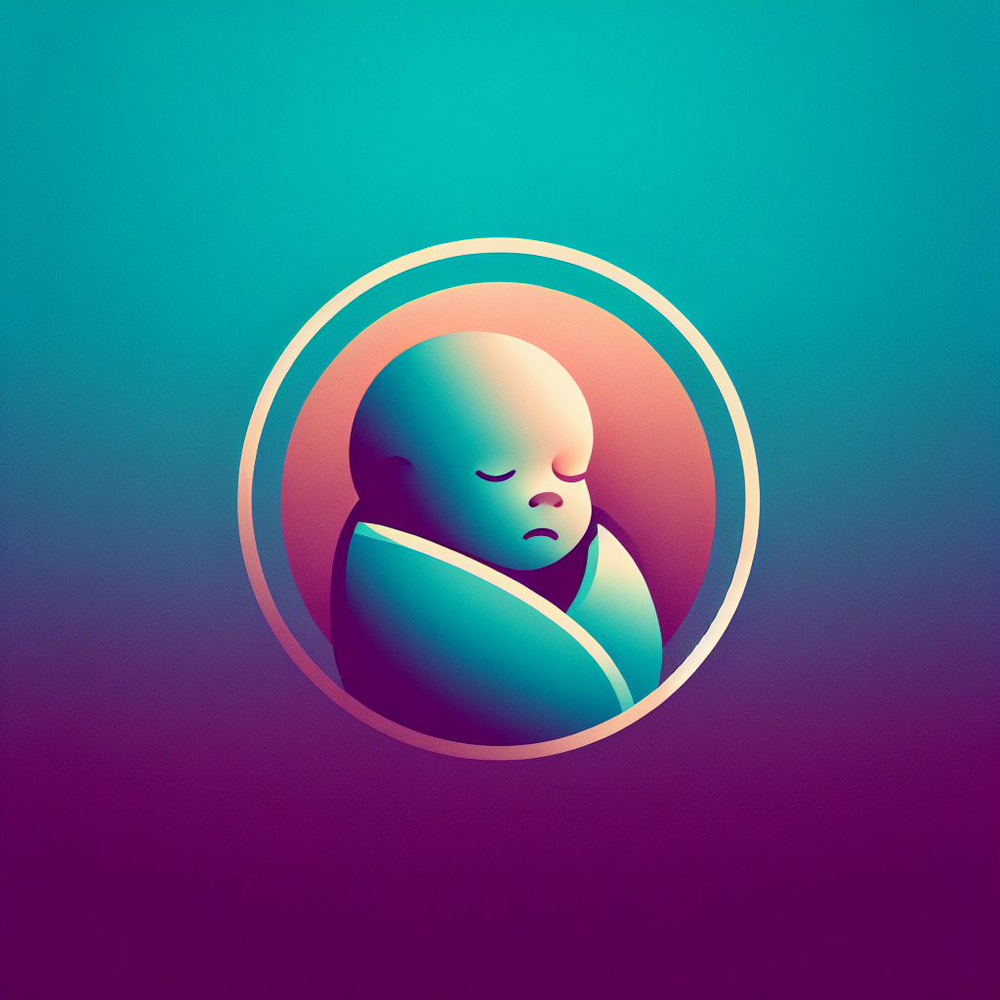

Archivo guardado: v6.png


'v6.png'

In [13]:
prompt_v6 = f"""
Generar una ilustración institucional clara y elegante de un recién nacido como figura central,
con un fondo armónico en degradado de la paleta IOMA (teal {PALETA_IOMA['teal']}, púrpura {PALETA_IOMA['purpura']}, magenta {PALETA_IOMA['magenta']}).
Incluir un halo luminoso o un marco circular sutil detrás del bebé para reforzar el foco.
Estilo minimalista, moderno y cálido, sin ningún tipo de texto en la imagen.
"""
ejecutar_prompt_imagen(prompt_v6, "v6")


## Costos de las imágenes generadas

En el caso de DALL·E (modelo `dall-e-3`), el costo no se mide en tokens como en los modelos de texto,
sino que se establece **por cada imagen generada**, dependiendo de la **calidad y el tamaño solicitado**.

- **DALL·E 3 estándar (1024×1024)**: USD 0.04 por imagen.  
- **DALL·E 3 estándar (1792×1024 o 1024×1792)**: USD 0.08 por imagen.  
- **DALL·E 3 HD (alta calidad, 1024×1024)**: USD 0.08 por imagen.  
- **DALL·E 3 HD (1792×1024 o 1024×1792)**: USD 0.12 por imagen.  

En este trabajo utilicé la **opción estándar 1024×1024 (USD 0.04 por imagen)**,
ya que permite obtener imágenes claras y de buena calidad a un costo accesible.
Esto implica que generar las seis versiones de prueba (v1–v6) tuvo un costo aproximado de **USD 0.24** en total.  

Comparativamente, optar por resoluciones más grandes o por la calidad HD hubiera duplicado o triplicado el costo,
sin ser estrictamente necesario para los objetivos del proyecto.  
De este modo, se privilegió el **equilibrio entre calidad visual y eficiencia de recursos**.
